In [0]:
import numpy as np 
from tqdm import tqdm
import cv2
import os
import shutil
import itertools
import imutils
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from plotly import tools

from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16, preprocess_input as preprocess_input_vgg16
from keras.applications.vgg19 import VGG19, preprocess_input as preprocess_input_vgg19
from keras.applications.resnet50 import ResNet50, preprocess_input as preprocess_input_resnet50
from keras.applications.resnet_v2 import ResNet101V2, preprocess_input as preprocess_input_resnet101v2
from keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input as preprocess_input_mobilenetv2 
from keras import layers
from keras.models import Model, Sequential
from keras.optimizers import Adam, RMSprop
from keras.callbacks import EarlyStopping

init_notebook_mode(connected=True)
RANDOM_SEED = 123

Using TensorFlow backend.


In [0]:
def CreateDatasetFolders():
  if not os.path.exists('dataset'):
    os.makedirs('dataset')
  if not os.path.exists('dataset/TEST'):
    os.makedirs('dataset/TEST')
  if not os.path.exists('dataset/TEST/YES'):
    os.makedirs('dataset/TEST/YES')
  if not os.path.exists('dataset/TEST/NO'):
    os.makedirs('dataset/TEST/NO')
  if not os.path.exists('dataset/TRAIN'):
    os.makedirs('dataset/TRAIN')
  if not os.path.exists('dataset/TRAIN/YES'):
    os.makedirs('dataset/TRAIN/YES')
  if not os.path.exists('dataset/TRAIN/NO'):
    os.makedirs('dataset/TRAIN/NO')
  if not os.path.exists('dataset/VAL'):
    os.makedirs('dataset/VAL')
  if not os.path.exists('dataset/VAL/YES'):
    os.makedirs('dataset/VAL/YES')
  if not os.path.exists('dataset/VAL/NO'):
    os.makedirs('dataset/VAL/NO')

In [0]:
CreateDatasetFolders()

In [0]:
if not os.path.exists('input/brain_tumor_dataset'):
  os.makedirs('input/brain_tumor_dataset')
if not os.path.exists('input/brain_tumor_dataset/YES'):
  os.makedirs('input/brain_tumor_dataset/YES')
if not os.path.exists('input/brain_tumor_dataset/NO'):
  os.makedirs('input/brain_tumor_dataset/NO')

In [0]:
IMG_PATH = './input/brain_tumor_dataset/'
# split the data by train/val/test
for CLASS in os.listdir(IMG_PATH):
    if not CLASS.startswith('.'):
        IMG_NUM = len(os.listdir(IMG_PATH + CLASS))
        for (n, FILE_NAME) in enumerate(os.listdir(IMG_PATH + CLASS)):
            img = IMG_PATH + CLASS + '/' + FILE_NAME
            if n < 5:
                shutil.copy(img, 'dataset/TEST/' + CLASS.upper() + '/' + FILE_NAME)
            elif n < 0.8*IMG_NUM:
                shutil.copy(img, 'dataset/TRAIN/'+ CLASS.upper() + '/' + FILE_NAME)
            else:
                shutil.copy(img, 'dataset/VAL/'+ CLASS.upper() + '/' + FILE_NAME)

**Data Import and Preprocessing**

In [0]:
def load_data(dir_path, img_size=(100, 100)):
    """
    Load resized images as np.arrays to workspace
    """
    X = []
    y = []
    i = 0
    labels = dict()
    for path in tqdm(sorted(os.listdir(dir_path))):
        # print('path is:', path)
        if not path.startswith('.'):
            labels[i] = path
            for file in os.listdir(dir_path + path):
                if not file.startswith('.'):
                    # print('file is:', file)
                    img = cv2.imread(dir_path + path + '/' + file)
                    X.append(img)
                    y.append(i)
            i += 1
    X = np.array(X)
    y = np.array(y)
    print(f'{len(X)} images loaded from {dir_path} directory.')
    return X, y, labels

In [0]:
TRAIN_DIR = 'dataset/TRAIN/'
TEST_DIR = 'dataset/TEST/'
VAL_DIR = 'dataset/VAL/'
IMG_SIZE = (224, 224)

# use predefined function to load the image data into workspace
X_train, y_train, labels = load_data(TRAIN_DIR, IMG_SIZE)
X_test, y_test, _ = load_data(TEST_DIR, IMG_SIZE)
X_val, y_val, _ = load_data(VAL_DIR, IMG_SIZE)

100%|██████████| 2/2 [00:00<00:00, 20.58it/s]

193 images loaded from dataset/TRAIN/ directory.
10 images loaded from dataset/TEST/ directory.
50 images loaded from dataset/VAL/ directory.


In [0]:
X_train

In [0]:
y_train

In [0]:
labels

{0: 'NO', 1: 'YES'}

In [0]:
def plot_samples(X, y, labels_dict, n=20):
    """
    Creates a gridplot for desired number of images (n) from the specified set
    """
    for index in range(len(labels_dict)):
        imgs = X[np.argwhere(y == index)][:n]
        j = 5
        i = int(n/j)

        plt.figure(figsize=(15, 12))
        c = 1
        for img in imgs:
            plt.subplot(i, j, c)
            plt.imshow(img[0])

            plt.xticks([])
            plt.yticks([])
            c += 1
        plt.suptitle('Tumor: {}'.format(labels_dict[index]))
        plt.show()

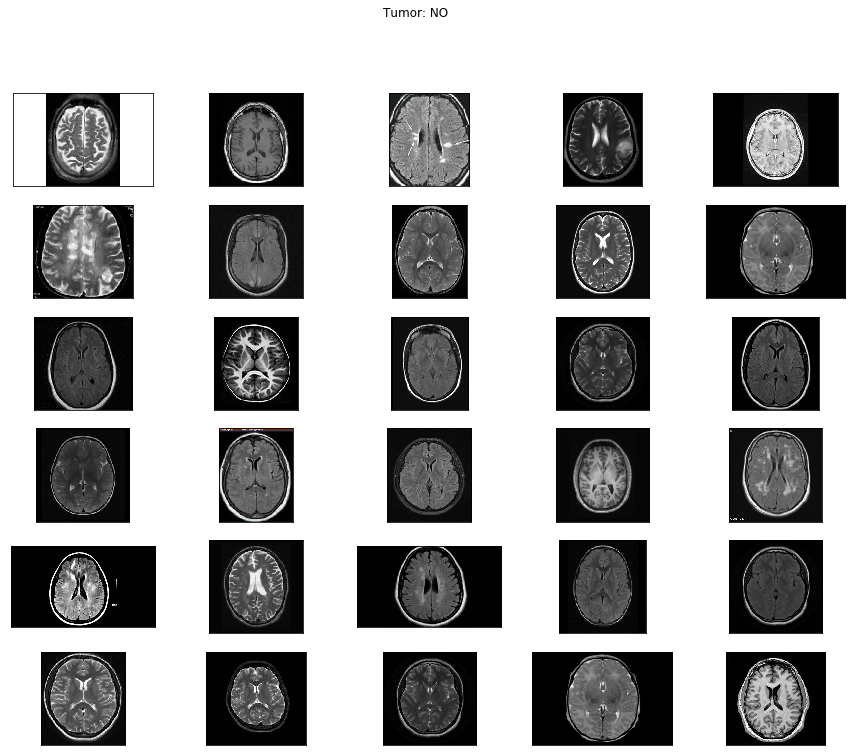

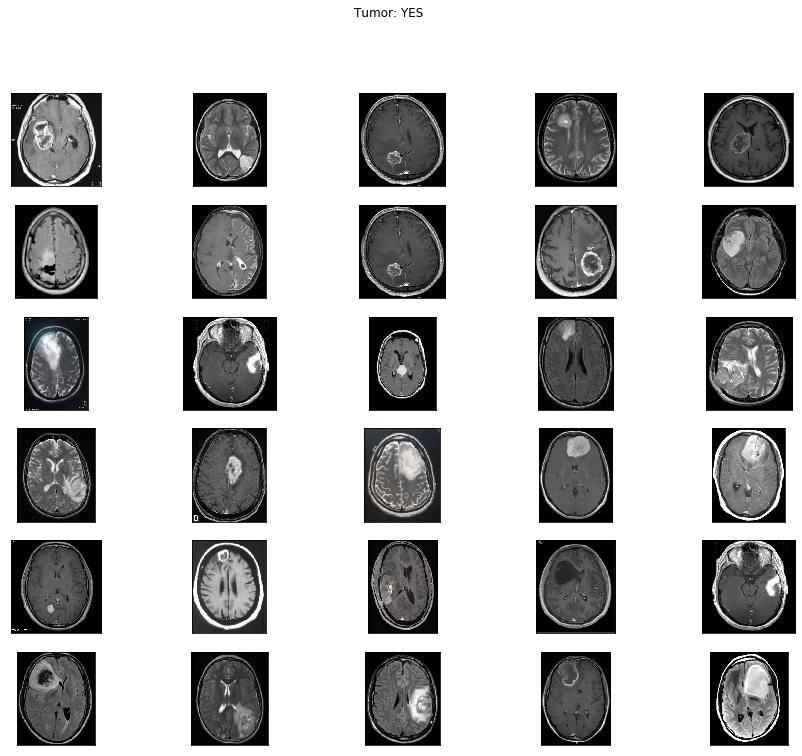

In [0]:
plot_samples(X_train, y_train, labels, 30)

In [0]:
def crop_imgs(set_name, add_pixels_value=0):
    """
    Finds the extreme points on the image and crops the rectangular out of them
    """
    set_new = []
    for img in set_name:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        gray = cv2.GaussianBlur(gray, (5, 5), 0)

        # threshold the image, then perform a series of erosions +
        # dilations to remove any small regions of noise
        thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
        thresh = cv2.erode(thresh, None, iterations=2)
        thresh = cv2.dilate(thresh, None, iterations=2)

        # find contours in thresholded image, then grab the largest one
        cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)
        c = max(cnts, key=cv2.contourArea)

        # find the extreme points
        extLeft = tuple(c[c[:, :, 0].argmin()][0])
        extRight = tuple(c[c[:, :, 0].argmax()][0])
        extTop = tuple(c[c[:, :, 1].argmin()][0])
        extBot = tuple(c[c[:, :, 1].argmax()][0])

        ADD_PIXELS = add_pixels_value
        new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()
        set_new.append(new_img)
    return np.array(set_new)

In [0]:
# apply this for each set
X_train_crop = crop_imgs(set_name=X_train)
X_val_crop = crop_imgs(set_name=X_val)
X_test_crop = crop_imgs(set_name=X_test)

In [0]:
X_train_crop

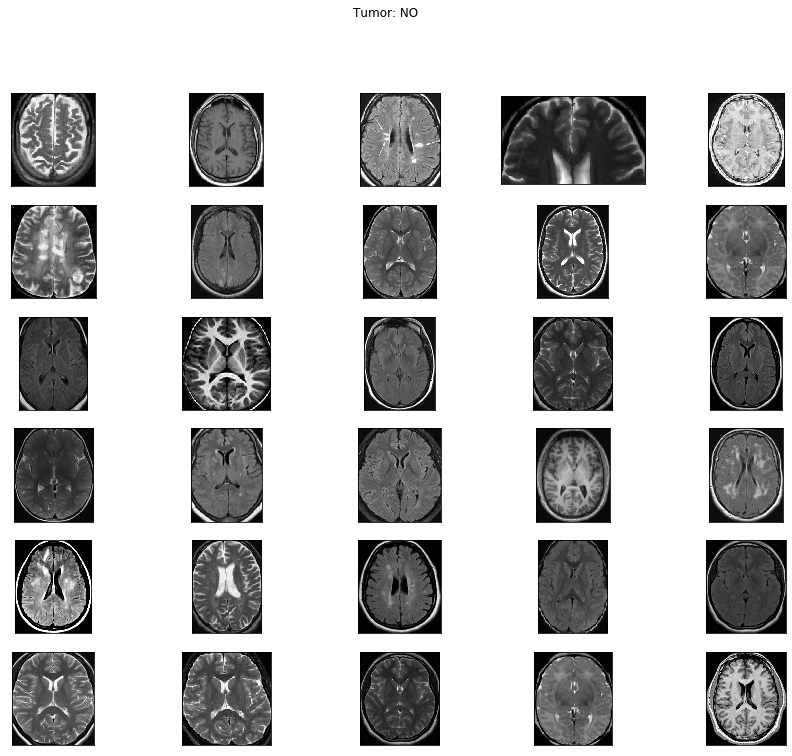

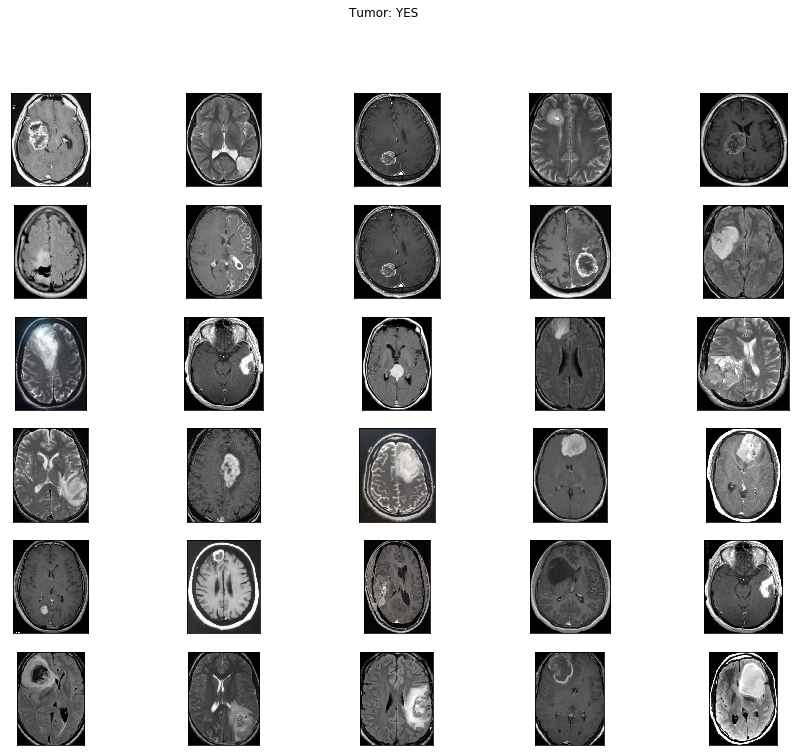

In [0]:
plot_samples(X_train_crop, y_train, labels, 30)

In [0]:
def save_new_images(x_set, y_set, folder_name):
    i = 0
    for (img, imclass) in zip(x_set, y_set):
        if imclass == 0:
            cv2.imwrite(folder_name+'NO/'+str(i)+'.jpg', img)
        else:
            cv2.imwrite(folder_name+'YES/'+str(i)+'.jpg', img)
        i += 1

In [0]:
# saving new images to the folder
!mkdir dataset/TRAIN_CROP dataset/TEST_CROP dataset/VAL_CROP dataset/TRAIN_CROP/YES dataset/TRAIN_CROP/NO dataset/TEST_CROP/YES dataset/TEST_CROP/NO dataset/VAL_CROP/YES dataset/VAL_CROP/NO
save_new_images(X_train_crop, y_train, folder_name='dataset/TRAIN_CROP/')
save_new_images(X_val_crop, y_val, folder_name='dataset/VAL_CROP/')
save_new_images(X_test_crop, y_test, folder_name='dataset/TEST_CROP/')

**Preprocess image needed for VGG-16 model**

In [0]:
# The next step would be resizing images to (224,224) and applying preprocessing needed for VGG-16 model input.
def preprocess_imgs_vgg16(set_name, img_size):
    """
    Resize and apply VGG-15 preprocessing
    """
    set_new = []
    for img in set_name:
        img = cv2.resize(
            img,
            dsize=img_size,
            interpolation=cv2.INTER_CUBIC
        )
        set_new.append(preprocess_input_vgg16(img))
    return np.array(set_new)

In [0]:
X_train_prep_vgg16 = preprocess_imgs_vgg16(set_name=X_train_crop, img_size=IMG_SIZE)
X_test_prep_vgg16 = preprocess_imgs_vgg16(set_name=X_test_crop, img_size=IMG_SIZE)
X_val_prep_vgg16 = preprocess_imgs_vgg16(set_name=X_val_crop, img_size=IMG_SIZE)

**Data Augmentation**

In [0]:
# set the paramters we want to change randomly
demo_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.05,
    height_shift_range=0.05,
    rescale=1./255,
    shear_range=0.05,
    brightness_range=[0.1, 1.5],
    horizontal_flip=True,
    vertical_flip=True
)

In [0]:
len(X_train_crop[0])

162

In [0]:
os.mkdir('preview')
x = X_train_crop[0]  
x = x.reshape((1,) + x.shape) 

i = 0
for batch in demo_datagen.flow(x, batch_size=1, save_to_dir='preview', save_prefix='aug_img', save_format='jpg'):
    i += 1
    if i > 20:
        break 

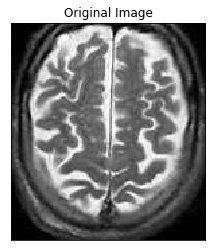

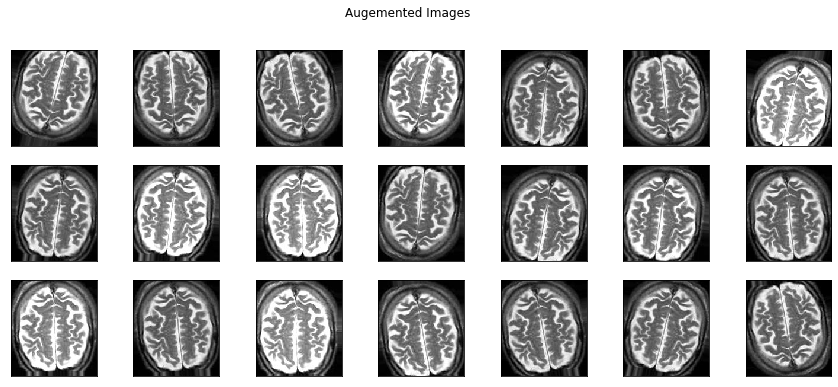

In [0]:
plt.imshow(X_train_crop[0])
plt.xticks([])
plt.yticks([])
plt.title('Original Image')
plt.show()

plt.figure(figsize=(15,6))
i = 1
for img in os.listdir('preview/'):
    img = cv2.cv2.imread('preview/' + img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(3,7,i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    i += 1
    if i > 3*7:
        break
plt.suptitle('Augemented Images')
plt.show()

In [0]:
# Data augmentation
TRAIN_DIR = 'dataset/TRAIN_CROP/'
VAL_DIR = 'dataset/VAL_CROP/'

train_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    brightness_range=[0.5, 1.5],
    horizontal_flip=True,
    vertical_flip=True,
    preprocessing_function=preprocess_input_vgg16
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input_vgg16
)

train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=32,
    class_mode='binary',
    seed=RANDOM_SEED
)

validation_generator = test_datagen.flow_from_directory(
    VAL_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=16,
    class_mode='binary',
    seed=RANDOM_SEED
)

Found 193 images belonging to 2 classes.
Found 50 images belonging to 2 classes.


In [0]:
# Model building
# load base model
base_model_vgg16 = VGG16(weights='imagenet',include_top=False, input_shape=IMG_SIZE + (3,))





58892288/58889256 [==============================] - 1s 0us/step








**VGG16 model**

In [0]:
NUM_CLASSES = 1

model = Sequential()
model.add(base_model_vgg16)
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(NUM_CLASSES, activation='sigmoid'))

model.layers[0].trainable = False

model.compile(
    loss='binary_crossentropy',
    optimizer=RMSprop(lr=1e-4),
    metrics=['accuracy']
)

model.summary()


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 25088)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 25089     
Total params: 14,739,777
Trainable params: 25,089
Non-trainable params: 14,714,688
_________________________________________________________________


In [0]:
EPOCHS = 30
es = EarlyStopping(
    monitor='val_acc', 
    mode='max',
    patience=6
)

history = model.fit_generator(
    train_generator,
    steps_per_epoch=50,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=25,
    callbacks=[es]
)



Epoch 1/30
50/50 [==============================] - 34s 673ms/step - loss: 3.8439 - acc: 0.5980 - val_loss: 2.6512 - val_acc: 0.7500
Epoch 2/30
50/50 [==============================] - 21s 413ms/step - loss: 2.8048 - acc: 0.7105 - val_loss: 2.2152 - val_acc: 0.7690
Epoch 3/30
50/50 [==============================] - 22s 442ms/step - loss: 1.9165 - acc: 0.7717 - val_loss: 2.0385 - val_acc: 0.7816
Epoch 4/30
50/50 [==============================] - 21s 424ms/step - loss: 2.0546 - acc: 0.7828 - val_loss: 1.8832 - val_acc: 0.8013
Epoch 5/30
50/50 [==============================] - 21s 427ms/step - loss: 1.8503 - acc: 0.7871 - val_loss: 1.9081 - val_acc: 0.8165
Epoch 6/30
50/50 [==============================] - 22s 434ms/step - loss: 1.6757 - acc: 0.7869 - val_loss: 1.6856 - val_acc: 0.8259
Epoch 7/30
50/50 [==============================] - 22s 450ms/step - loss: 1.3771 - acc: 0.8324 - val_loss: 1.7153 - val_acc: 0.8196
Epoch 8/30
50/50 [==============================] - 21s 427ms/step 

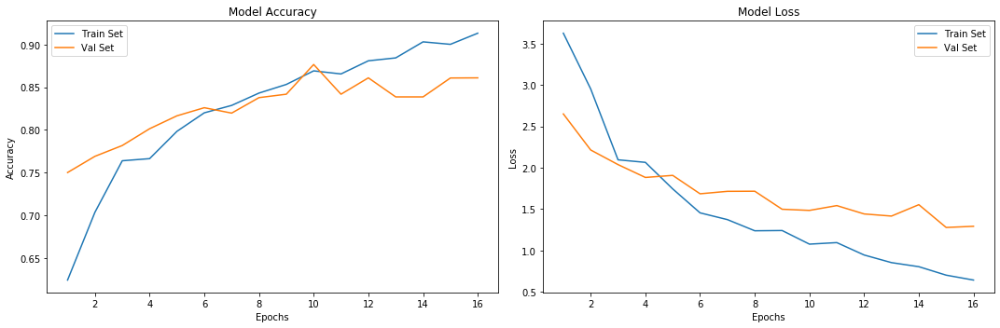

In [0]:
# Model performance
# plot model performance
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(history.epoch) + 1)

plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Train Set')
plt.plot(epochs_range, val_acc, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Model Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Train Set')
plt.plot(epochs_range, val_loss, label='Val Set')
plt.legend(loc="best")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Model Loss')

plt.tight_layout()
plt.show()

In [0]:
# validate on val set
predictions = model.predict(X_val_prep_vgg16)
predictions = [1 if x>0.5 else 0 for x in predictions]

accuracy = accuracy_score(y_val, predictions)
print('Val Accuracy = %.2f' % accuracy)

Val Accuracy = 0.86


In [0]:
# validate on test set
predictions = model.predict(X_test_prep_vgg16)
predictions = [1 if x>0.5 else 0 for x in predictions]

accuracy = accuracy_score(y_test, predictions)
print('Test Accuracy = %.2f' % accuracy)


Test Accuracy = 0.90


**VGG-19 Model**

In [0]:
# The next step would be resizing images to (224,224) and applying preprocessing needed for VGG-19 model input.
def preprocess_imgs(set_name, img_size):
    """
    Resize and apply VGG-19 preprocessing
    """
    set_new = []
    for img in set_name:
        img = cv2.resize(
            img,
            dsize=img_size,
            interpolation=cv2.INTER_CUBIC
        )
        set_new.append(preprocess_input_vgg19(img))
    return np.array(set_new)

X_train_prep = preprocess_imgs(set_name=X_train_crop, img_size=IMG_SIZE)
X_test_prep = preprocess_imgs(set_name=X_test_crop, img_size=IMG_SIZE)
X_val_prep = preprocess_imgs(set_name=X_val_crop, img_size=IMG_SIZE)

# Data augmentation
TRAIN_DIR = 'dataset/TRAIN_CROP/'
VAL_DIR = 'dataset/VAL_CROP/'

train_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    brightness_range=[0.5, 1.5],
    horizontal_flip=True,
    vertical_flip=True,
    preprocessing_function=preprocess_input_vgg19
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input_vgg19
)

train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=32,
    class_mode='binary',
    seed=RANDOM_SEED
)

validation_generator = test_datagen.flow_from_directory(
    VAL_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=16,
    class_mode='binary',
    seed=RANDOM_SEED
)

base_model = VGG19(weights='imagenet',include_top=False, input_shape=IMG_SIZE + (3,))

NUM_CLASSES = 1

model = Sequential()
model.add(base_model)
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(NUM_CLASSES, activation='sigmoid'))

model.layers[0].trainable = False

model.compile(
    loss='binary_crossentropy',
    optimizer=Adam(lr=1e-4),
    metrics=['accuracy']
)

model.summary()

EPOCHS = 30
es = EarlyStopping(
    monitor='val_acc', 
    mode='max',
    patience=6
)

history = model.fit_generator(
    train_generator,
    steps_per_epoch=50,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=25,
    callbacks=[es]
)

# validate on val set
predictions = model.predict(X_val_prep)
predictions = [1 if x>0.5 else 0 for x in predictions]

accuracy = accuracy_score(y_val, predictions)
print('Val Accuracy = %.2f' % accuracy)

# validate on test set
predictions = model.predict(X_test_prep)
predictions = [1 if x>0.5 else 0 for x in predictions]

accuracy = accuracy_score(y_test, predictions)
print('Test Accuracy = %.2f' % accuracy)

Found 193 images belonging to 2 classes.
Found 50 images belonging to 2 classes.
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Model)                (None, 7, 7, 512)         20024384  
_________________________________________________________________
flatten_3 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 25088)             0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 25089     
Total params: 20,049,473
Trainable params: 25,089
Non-trainable params: 20,024,384
_________________________________________________________________
Epoch 1/30
50/50 [==============================] - 24s 476ms/step - loss: 3.3871 - acc: 0.6032 - val_loss: 3.8613 - val_acc: 0.6677
Epoch 2/30
50/50 [===

**ResNet50**

In [0]:
# The next step would be resizing images to (224,224) and applying preprocessing needed for ResNet-50 model input.
def preprocess_imgs(set_name, img_size):
    """
    Resize and apply ResNet-50 preprocessing
    """
    set_new = []
    for img in set_name:
        img = cv2.resize(
            img,
            dsize=img_size,
            interpolation=cv2.INTER_CUBIC
        )
        set_new.append(preprocess_input_resnet50(img))
    return np.array(set_new)

X_train_prep = preprocess_imgs(set_name=X_train_crop, img_size=IMG_SIZE)
X_test_prep = preprocess_imgs(set_name=X_test_crop, img_size=IMG_SIZE)
X_val_prep = preprocess_imgs(set_name=X_val_crop, img_size=IMG_SIZE)

# Data augmentation
TRAIN_DIR = 'dataset/TRAIN_CROP/'
VAL_DIR = 'dataset/VAL_CROP/'

train_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    brightness_range=[0.5, 1.5],
    horizontal_flip=True,
    vertical_flip=True,
    preprocessing_function=preprocess_input_resnet50
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input_resnet50
)

train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=32,
    class_mode='binary',
    seed=RANDOM_SEED
)

validation_generator = test_datagen.flow_from_directory(
    VAL_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=16,
    class_mode='binary',
    seed=RANDOM_SEED
)

base_model = ResNet50(weights='imagenet',include_top=False, input_shape=IMG_SIZE + (3,))

NUM_CLASSES = 1

model = Sequential()
model.add(base_model)
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(NUM_CLASSES, activation='sigmoid'))

model.layers[0].trainable = False

model.compile(
    loss='binary_crossentropy',
    optimizer=Adam(lr=1e-4),
    metrics=['accuracy']
)

model.summary()

EPOCHS = 50
es = EarlyStopping(
    monitor='val_acc', 
    mode='max',
    patience=6
)

history = model.fit_generator(
    train_generator,
    steps_per_epoch=50,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=25,
    callbacks=[es]
)

# validate on val set
predictions = model.predict(X_val_prep)
predictions = [1 if x>0.5 else 0 for x in predictions]

accuracy = accuracy_score(y_val, predictions)
print('Val Accuracy = %.2f' % accuracy)

# validate on test set
predictions = model.predict(X_test_prep)
predictions = [1 if x>0.5 else 0 for x in predictions]

accuracy = accuracy_score(y_test, predictions)
print('Test Accuracy = %.2f' % accuracy)

Found 193 images belonging to 2 classes.
Found 50 images belonging to 2 classes.




/usr/local/lib/python3.6/dist-packages/keras_applications/resnet50.py:265: UserWarning:

The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.



94658560/94653016 [==============================] - 1s 0us/step
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 7, 7, 2048)        23587712  
_________________________________________________________________
flatten_4 (Flatten)          (None, 100352)            0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 100352)            0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 100353    
Total params: 23,688,065
Trainable params: 100,353
Non-trainable params: 23,587,712
_________________________________________________________________
Epoch 1/50
50/50 [==============================] - 27s 546ms/step - loss: 0.6770 - acc: 0.7484 - val_loss: 1.1283 - val_acc: 0.6456
Epoch 2/50
50/50 [==================

In [0]:
# The next step would be resizing images to (224,224) and applying preprocessing needed for VGG-16 model input.
def preprocess_imgs(set_name, img_size):
    """
    Resize and apply VGG-15 preprocessing
    """
    set_new = []
    for img in set_name:
        img = cv2.resize(
            img,
            dsize=img_size,
            interpolation=cv2.INTER_CUBIC
        )
        set_new.append(preprocess_input_resnet50(img))
    return np.array(set_new)

X_train_prep = preprocess_imgs(set_name=X_train_crop, img_size=IMG_SIZE)
X_test_prep = preprocess_imgs(set_name=X_test_crop, img_size=IMG_SIZE)
X_val_prep = preprocess_imgs(set_name=X_val_crop, img_size=IMG_SIZE)

# Data augmentation
TRAIN_DIR = 'dataset/TRAIN_CROP/'
VAL_DIR = 'dataset/VAL_CROP/'

train_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    brightness_range=[0.5, 1.5],
    horizontal_flip=True,
    vertical_flip=True,
    preprocessing_function=preprocess_input_resnet50
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input_resnet50
)

train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=32,
    class_mode='binary',
    seed=RANDOM_SEED
)

validation_generator = test_datagen.flow_from_directory(
    VAL_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=16,
    class_mode='binary',
    seed=RANDOM_SEED
)

base_model = ResNet50(weights='imagenet',include_top=False, input_shape=IMG_SIZE + (3,))

NUM_CLASSES = 1

model = Sequential()
model.add(base_model)
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(NUM_CLASSES, activation='sigmoid'))

model.layers[0].trainable = False

model.compile(
    loss='binary_crossentropy',
    optimizer=RMSprop(lr=1e-4),
    metrics=['accuracy']
)

model.summary()

EPOCHS = 30
es = EarlyStopping(
    monitor='val_acc', 
    mode='max',
    patience=6
)

history = model.fit_generator(
    train_generator,
    steps_per_epoch=50,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=25,
    callbacks=[es]
)

# validate on val set
predictions = model.predict(X_val_prep)
predictions = [1 if x>0.5 else 0 for x in predictions]

accuracy = accuracy_score(y_val, predictions)
print('Val Accuracy = %.2f' % accuracy)

# validate on test set
predictions = model.predict(X_test_prep)
predictions = [1 if x>0.5 else 0 for x in predictions]

accuracy = accuracy_score(y_test, predictions)
print('Test Accuracy = %.2f' % accuracy)

Found 193 images belonging to 2 classes.
Found 50 images belonging to 2 classes.


/usr/local/lib/python3.6/dist-packages/keras_applications/resnet50.py:265: UserWarning:

The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.



Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 7, 7, 2048)        23587712  
_________________________________________________________________
flatten_5 (Flatten)          (None, 100352)            0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 100352)            0         
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 100353    
Total params: 23,688,065
Trainable params: 100,353
Non-trainable params: 23,587,712
_________________________________________________________________
Epoch 1/30
50/50 [==============================] - 27s 532ms/step - loss: 0.7425 - acc: 0.7111 - val_loss: 0.4986 - val_acc: 0.8481
Epoch 2/30
50/50 [==============================] - 20s 409ms/step - loss: 0.3542 - acc: 0.8746 - val

**ResNet101V2**

In [0]:
def preprocess_imgs(set_name, img_size):
    """
    Resize and apply ResNet101V2 preprocessing
    """
    set_new = []
    for img in set_name:
        img = cv2.resize(
            img,
            dsize=img_size,
            interpolation=cv2.INTER_CUBIC
        )
        set_new.append(preprocess_input_resnet101v2(img))
    return np.array(set_new)

X_train_prep = preprocess_imgs(set_name=X_train_crop, img_size=IMG_SIZE)
X_test_prep = preprocess_imgs(set_name=X_test_crop, img_size=IMG_SIZE)
X_val_prep = preprocess_imgs(set_name=X_val_crop, img_size=IMG_SIZE)

# Data augmentation
TRAIN_DIR = 'dataset/TRAIN_CROP/'
VAL_DIR = 'dataset/VAL_CROP/'

train_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    brightness_range=[0.5, 1.5],
    horizontal_flip=True,
    vertical_flip=True,
    preprocessing_function=preprocess_input_resnet101v2
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input_resnet101v2
)

train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=32,
    class_mode='binary',
    seed=RANDOM_SEED
)

validation_generator = test_datagen.flow_from_directory(
    VAL_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=16,
    class_mode='binary',
    seed=RANDOM_SEED
)

base_model = ResNet101V2(weights='imagenet',include_top=False, input_shape=IMG_SIZE + (3,))

NUM_CLASSES = 1

model = Sequential()
model.add(base_model)
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(NUM_CLASSES, activation='sigmoid'))

model.layers[0].trainable = False

model.compile(
    loss='binary_crossentropy',
    optimizer=RMSprop(lr=1e-4),
    metrics=['accuracy']
)

model.summary()

EPOCHS = 30
es = EarlyStopping(
    monitor='val_acc', 
    mode='max',
    patience=6
)

history = model.fit_generator(
    train_generator,
    steps_per_epoch=50,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=25,
    callbacks=[es]
)

# validate on val set
predictions = model.predict(X_val_prep)
predictions = [1 if x>0.5 else 0 for x in predictions]

accuracy = accuracy_score(y_val, predictions)
print('Val Accuracy = %.2f' % accuracy)

# validate on test set
predictions = model.predict(X_test_prep)
predictions = [1 if x>0.5 else 0 for x in predictions]

accuracy = accuracy_score(y_test, predictions)
print('Test Accuracy = %.2f' % accuracy)

Found 193 images belonging to 2 classes.
Found 50 images belonging to 2 classes.
171319296/171317808 [==============================] - 2s 0us/step
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet101v2 (Model)          (None, 7, 7, 2048)        42626560  
_________________________________________________________________
flatten_6 (Flatten)          (None, 100352)            0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 100352)            0         
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 100353    
Total params: 42,726,913
Trainable params: 100,353
Non-trainable params: 42,626,560
_________________________________________________________________
Epoch 1/30
50/50 [==============================] - 34s 684ms/step - loss: 0.7330 - ac

**MobileNetV2**

In [0]:
# The next step would be resizing images to (224,224) and applying preprocessing needed for VGG-16 model input.
def preprocess_imgs(set_name, img_size):
    """
    Resize and apply mobilenetv2 preprocessing
    """
    set_new = []
    for img in set_name:
        img = cv2.resize(
            img,
            dsize=img_size,
            interpolation=cv2.INTER_CUBIC
        )
        set_new.append(preprocess_input_mobilenetv2(img))
    return np.array(set_new)

X_train_prep = preprocess_imgs(set_name=X_train_crop, img_size=IMG_SIZE)
X_test_prep = preprocess_imgs(set_name=X_test_crop, img_size=IMG_SIZE)
X_val_prep = preprocess_imgs(set_name=X_val_crop, img_size=IMG_SIZE)

# Data augmentation
TRAIN_DIR = 'dataset/TRAIN_CROP/'
VAL_DIR = 'dataset/VAL_CROP/'

train_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    brightness_range=[0.5, 1.5],
    horizontal_flip=True,
    vertical_flip=True,
    preprocessing_function=preprocess_input_mobilenetv2
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input_mobilenetv2
)

train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=32,
    class_mode='binary',
    seed=RANDOM_SEED
)

validation_generator = test_datagen.flow_from_directory(
    VAL_DIR,
    color_mode='rgb',
    target_size=IMG_SIZE,
    batch_size=16,
    class_mode='binary',
    seed=RANDOM_SEED
)

base_model = MobileNetV2(weights='imagenet',include_top=False, input_shape=IMG_SIZE + (3,))

NUM_CLASSES = 1

model = Sequential()
model.add(base_model)
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(NUM_CLASSES, activation='sigmoid'))

model.layers[0].trainable = False

model.compile(
    loss='binary_crossentropy',
    optimizer=RMSprop(lr=1e-3),
    metrics=['accuracy']
)

model.summary()

EPOCHS = 30
es = EarlyStopping(
    monitor='val_acc',
    mode='max',
    patience=6
)

history = model.fit_generator(
    train_generator,
    steps_per_epoch=50,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=25,
    callbacks=[es]
)

# validate on val set
predictions = model.predict(X_val_prep)
predictions = [1 if x>0.5 else 0 for x in predictions]

accuracy = accuracy_score(y_val, predictions)
print('Val Accuracy = %.2f' % accuracy)

# validate on test set
predictions = model.predict(X_test_prep)
predictions = [1 if x>0.5 else 0 for x in predictions]

accuracy = accuracy_score(y_test, predictions)
print('Test Accuracy = %.2f' % accuracy)

Found 193 images belonging to 2 classes.
Found 50 images belonging to 2 classes.
9412608/9406464 [==============================] - 0s 0us/step
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Model) (None, 7, 7, 1280)        2257984   
_________________________________________________________________
flatten_7 (Flatten)          (None, 62720)             0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 62720)             0         
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 62721     
Total params: 2,320,705
Trainable params: 62,721
Non-trainable params: 2,257,984
_________________________________________________________________
Epoch 1/30
50/50 [==============================] - 30s 594ms/step - loss: 4.3529 - acc: 0.65

**Localization**

In [0]:
from IPython.display import clear_output
!git clone https://github.com/matterport/Mask_RCNN.git # load Mask R-CNN code implementation
!git clone https://github.com/ruslan-kl/brain-tumor.git # load new data set and annotations 
!pip install pycocotools

!rm -rf brain-tumor/.git/
!rm -rf Mask_RCNN/.git/

clear_output()

In [0]:
import os 
import sys
from tqdm import tqdm
import cv2
import numpy as np
import json
import skimage.draw
import matplotlib
import matplotlib.pyplot as plt
import random

In [0]:
# Root directory of the project
ROOT_DIR = os.path.abspath('Mask_RCNN/')
# Import Mask RCNN
sys.path.append(ROOT_DIR) 
from mrcnn.config import Config
from mrcnn import utils
from mrcnn.model import log
import mrcnn.model as modellib
from mrcnn import visualize
# Import COCO config
sys.path.append(os.path.join(ROOT_DIR, 'samples/coco/'))
sys.path.append(os.path.join(ROOT_DIR, 'samples/nucleus/'))
sys.path.append(os.path.join(ROOT_DIR, 'samples/balloon/'))
sys.path.append(os.path.join(ROOT_DIR, 'samples/shapes/'))
import coco
import nucleus
import balloon
import shapes

plt.rcParams['figure.facecolor'] = 'white'

clear_output()

In [0]:
MODEL_DIR = os.path.join(ROOT_DIR, 'logs') # directory to save logs and trained model
# ANNOTATIONS_DIR = 'brain-tumor/data/new/annotations/' # directory with annotations for train/val sets
DATASET_DIR = 'brain-tumor/data_cleaned/' # directory with image data
DEFAULT_LOGS_DIR = 'logs'

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
NUCLEUS_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_nucleus.h5")
BALLOON_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_balloon.h5")
SHAPES_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_shapes.h5")

# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

if not os.path.exists(NUCLEUS_MODEL_PATH):
    utils.download_trained_weights(NUCLEUS_MODEL_PATH)

if not os.path.exists(BALLOON_MODEL_PATH):
    utils.download_trained_weights(BALLOON_MODEL_PATH)

if not os.path.exists(SHAPES_MODEL_PATH):
    utils.download_trained_weights(SHAPES_MODEL_PATH)

... done downloading pretrained model!
... done downloading pretrained model!
... done downloading pretrained model!
... done downloading pretrained model!


In [0]:
class TumorConfig(Config):
    """Configuration for training on the brain tumor dataset.
    """
    # Give the configuration a recognizable name
    NAME = 'tumor_detector'
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 1  # background + tumor
    DETECTION_MIN_CONFIDENCE = 0.85
    STEPS_PER_EPOCH = 100
    LEARNING_RATE = 0.001

config = TumorConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.85
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE        

In [0]:
class BrainScanDataset(utils.Dataset):

    
    def load_brain_scan(self, dataset_dir, subset):
        """Load a subset of the FarmCow dataset.
        dataset_dir: Root directory of the dataset.
        subset: Subset to load: train or val
        """
        # Add classes. We have only one class to add.
        self.add_class("tumor", 1, "tumor")

        # Train or validation dataset?
        assert subset in ["train", "val", 'test']
        dataset_dir = os.path.join(dataset_dir, subset)

        annotations = json.load(open(os.path.join(DATASET_DIR, subset, 'annotations_'+subset+'.json')))
        annotations = list(annotations.values())  # don't need the dict keys

        # The VIA tool saves images in the JSON even if they don't have any
        # annotations. Skip unannotated images.
        annotations = [a for a in annotations if a['regions']]

        # Add images
        for a in annotations:
            # Get the x, y coordinaets of points of the polygons that make up
            # the outline of each object instance. These are stores in the
            # shape_attributes (see json format above)
            # The if condition is needed to support VIA versions 1.x and 2.x.
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']]

            # load_mask() needs the image size to convert polygons to masks.
            # Unfortunately, VIA doesn't include it in JSON, so we must read
            # the image. This is only managable since the dataset is tiny.
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            height, width = image.shape[:2]

            self.add_image(
                "tumor",
                image_id=a['filename'],  # use file name as a unique image id
                path=image_path,
                width=width, 
                height=height,
                polygons=polygons
            )

    def load_mask(self, image_id):
        """Generate instance masks for an image.
        Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        # If not a farm_cow dataset image, delegate to parent class.
        image_info = self.image_info[image_id]
        if image_info["source"] != "tumor":
            return super(self.__class__, self).load_mask(image_id)

        # Convert polygons to a bitmap mask of shape
        # [height, width, instance_count]
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            # Get indexes of pixels inside the polygon and set them to 1
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1

        # Return mask, and array of class IDs of each instance. Since we have
        # one class ID only, we return an array of 1s
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)
    
    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "tumor":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)

In [0]:
model = modellib.MaskRCNN(
    mode='training', 
    config=config, 
    model_dir=DEFAULT_LOGS_DIR
)

model.load_weights(
    COCO_MODEL_PATH, 
    by_name=True, 
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)







Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
box_ind is deprecated, use box_indices instead








**Train with learning rate - 1e-3, epochs - 15**

In [0]:
# Training dataset.
dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'train')
dataset_train.prepare()

# Validation dataset
dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'val')
dataset_val.prepare()

dataset_test = BrainScanDataset()
dataset_test.load_brain_scan(DATASET_DIR, 'test')
dataset_test.prepare()

# Since we're using a very small dataset, and starting from
# COCO trained weights, we don't need to train too long. Also,
# no need to train all layers, just the heads should do it.
print("Training network heads")
model.train(
    dataset_train, dataset_val,
    learning_rate=config.LEARNING_RATE,
    epochs=15,
    layers='heads'
)

Training network heads

Starting at epoch 0. LR=0.001

Checkpoint Path: logs/tumor_detector20200121T1645/mask_rcnn_tumor_detector_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistri

/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


/usr/local/lib/python3.6/dist-packages/keras/engine/training_generator.py:49: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the `keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'




Epoch 1/15
100/100 [==============================] - 110s 1s/step - loss: 1.9440 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.6190 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.6959 - mrcnn_mask_loss: 0.5208 - val_loss: 1.8111 - val_rpn_class_loss: 0.0367 - val_rpn_bbox_loss: 0.6002 - val_mrcnn_class_loss: 0.0855 - val_mrcnn_bbox_loss: 0.6898 - val_mrcnn_mask_loss: 0.3989

Epoch 2/15
100/100 [==============================] - 62s 619ms/step - loss: 1.3621 - rpn_class_loss: 0.0207 - rpn_bbox_loss: 0.4112 - mrcnn_class_loss: 0.0733 - mrcnn_bbox_loss: 0.5496 - mrcnn_mask_loss: 0.3074 - val_loss: 1.6726 - val_rpn_class_loss: 0.0495 - val_rpn_bbox_loss: 0.6400 - val_mrcnn_class_loss: 0.0656 - val_mrcnn_bbox_loss: 0.5380 - val_mrcnn_mask_loss: 0.3796
Epoch 3/15
100/100 [==============================] - 62s 615ms/step - loss: 1.0738 - rpn_class_loss: 0.0182 - rpn_bbox_loss: 0.3249 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.4164 - mrcnn_mask_loss: 0.2590 - val_loss: 1.3582 - val_rpn_

In [0]:
# Recreate the model in inference mode
model = modellib.MaskRCNN(
    mode="inference", 
    config=config,
    model_dir=DEFAULT_LOGS_DIR
)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)



Instructions for updating:
Use `tf.cast` instead.
Loading weights from  logs/tumor_detector20200121T1645/mask_rcnn_tumor_detector_0015.h5
Re-starting from epoch 15


In [0]:
def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask =\
        modellib.load_image_gt(dataset, config, 
                               img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]
    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names = ['tumor'], title="", ax=get_ax(),
        show_mask=True, show_box=True)

In [0]:
# dataset, img_id = dataset_val, 2
def get_overlaps(dataset, img_id):
  original_image, image_meta, gt_class_id, gt_box, gt_mask =\
      modellib.load_image_gt(dataset, config, 
                              img_id, use_mini_mask=False)
      
  results = model.detect([original_image], verbose=0)
  r = results[0]

  pred_box, pred_class_id, pred_score, pred_mask = r['rois'], r['class_ids'], r['scores'], r['masks']

  # Match predictions to ground truth
  gt_match, pred_match, overlaps = utils.compute_matches(
      gt_box, gt_class_id, gt_mask,
      pred_box, pred_class_id, pred_score, pred_mask,
      iou_threshold=0.5, score_threshold=0.5)

  # Captions per instance show score/IoU
  captions = ["" for m in gt_match] + ["{:.2f} / {:.2f}".format(
      pred_score[i],
      (overlaps[i, int(pred_match[i])]
          if pred_match[i] > -1 else overlaps[i].max()))
          for i in range(len(pred_match))]
  
  res = []
  for i in range(len(pred_match)):
    if pred_match[i] > -1:
      res.append(overlaps[i, int(pred_match[i])])
    else:
      res.append(overlaps[i].max())

  return res

In [0]:
def mean_iou_score(dataset):
  id_arr = dataset.image_ids
  total = 0.0
  count = 0
  for img_id in id_arr:
    overlaps = get_overlaps(dataset, img_id)
    total += sum(overlaps)
    count += len(overlaps)

  return total/count

In [0]:
mean_iou_score(dataset_val)

0.3311723545302162

In [0]:
mean_iou_score(dataset_test)

0.6464587211608886

In [0]:
def display_image(dataset, ind):
    plt.figure(figsize=(5,5))
    plt.imshow(dataset.load_image(ind))
    plt.xticks([])
    plt.yticks([])
    plt.title('Original Image')
    plt.show()

In [0]:
def get_ax(rows=1, cols=1, size=7):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

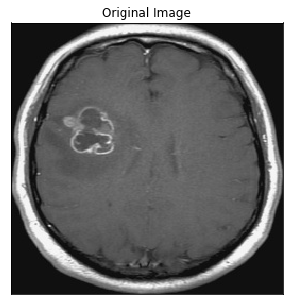

In [0]:
display_image(dataset_val, 2)

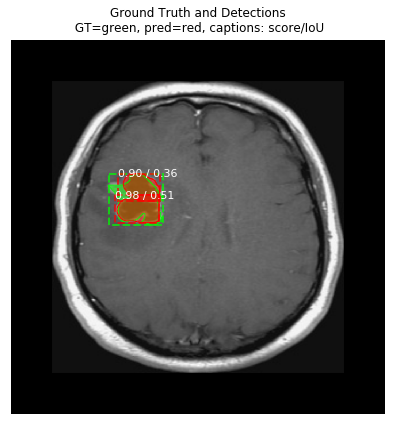

In [0]:
predict_and_plot_differences(dataset_val, 2)

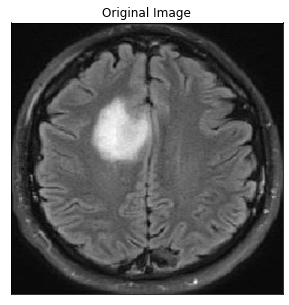

In [0]:
display_image(dataset_val, 0)

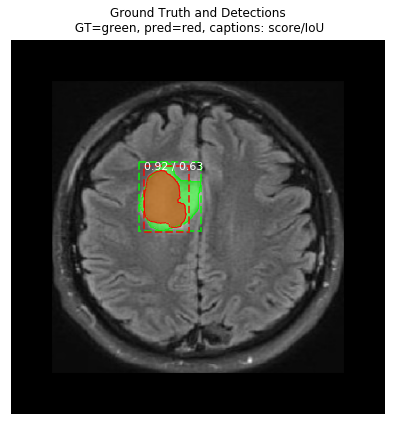

In [0]:
predict_and_plot_differences(dataset_val, 0)

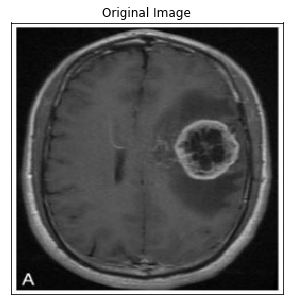

In [0]:
display_image(dataset_test, 0)

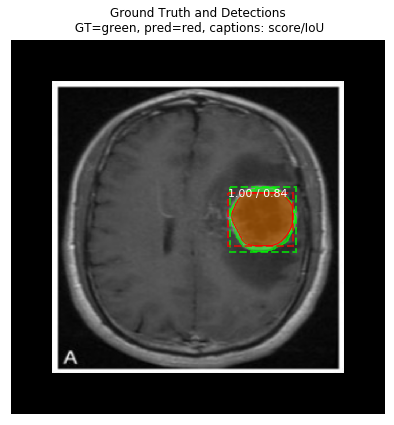

In [0]:
predict_and_plot_differences(dataset_test, 0)

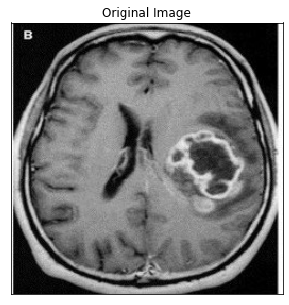

In [0]:
display_image(dataset_test, 1)

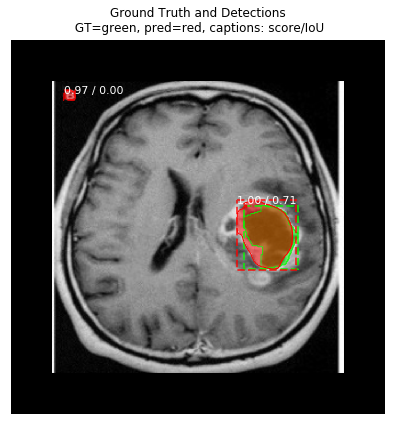

In [0]:
predict_and_plot_differences(dataset_test, 1)

In [0]:
# predict_and_plot_differences(dataset_test, 1)
def predict_and_plot_all_data(dataset):
  id_arr = dataset.image_ids
  for img_id in id_arr:
    predict_and_plot_differences(dataset, img_id)

In [0]:
def display_all_data(dataset):
  id_arr = dataset.image_ids
  for img_id in id_arr:
    display_image(dataset_test, img_id)
  

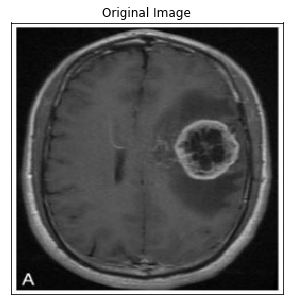

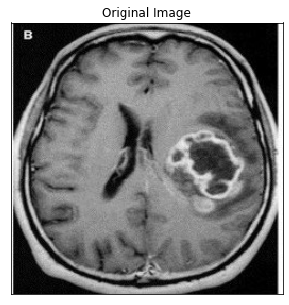

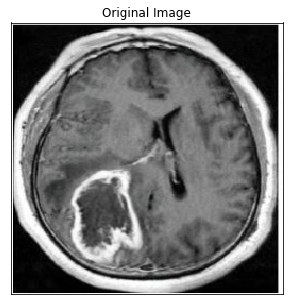

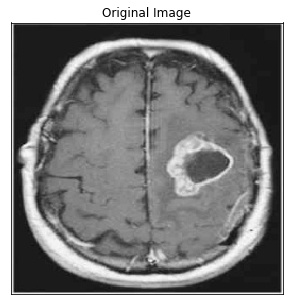

In [0]:
display_all_data(dataset_test)

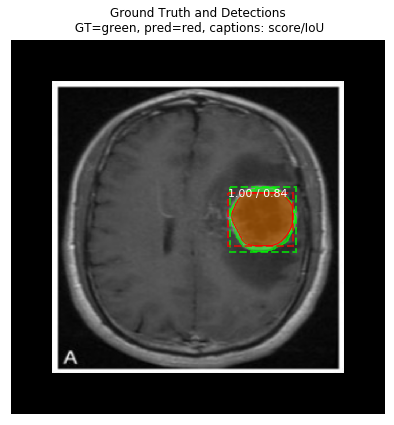

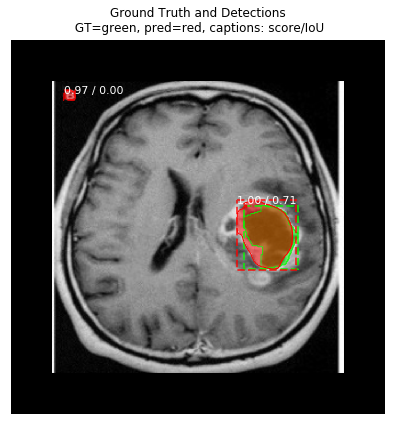

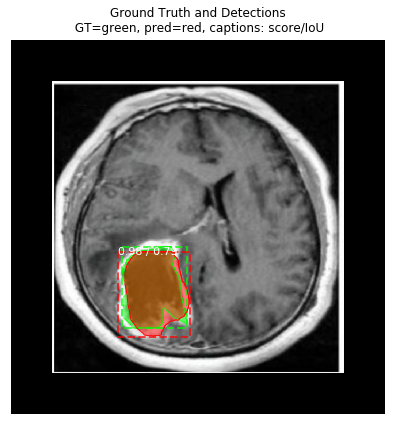

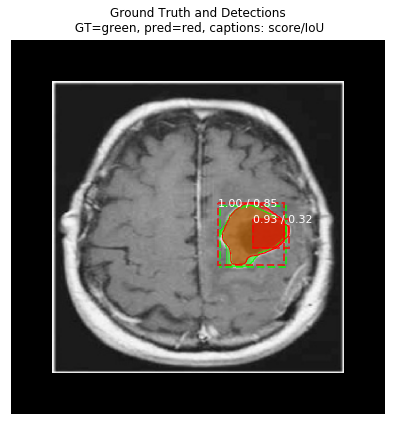

In [0]:
predict_and_plot_all_data(dataset_test)

In [0]:
# display_all_data(dataset_val)

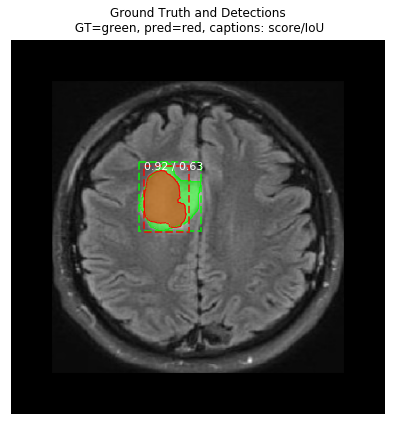

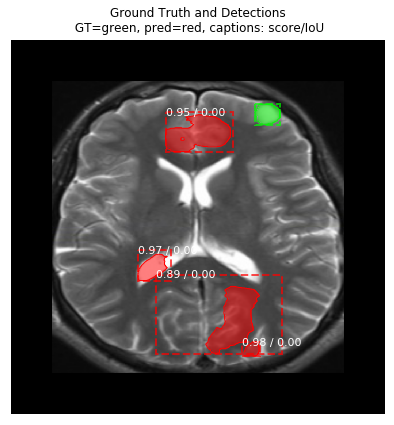

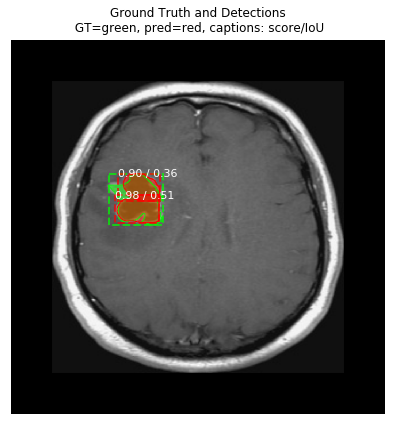

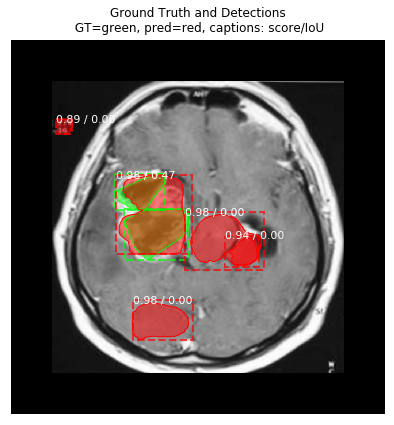

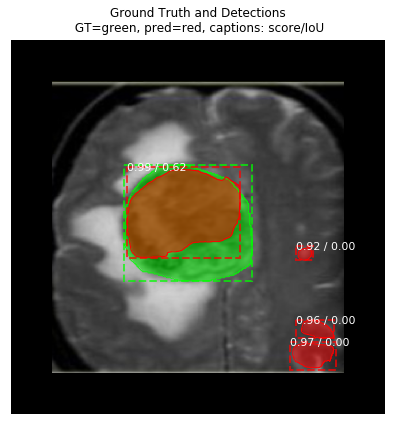

...

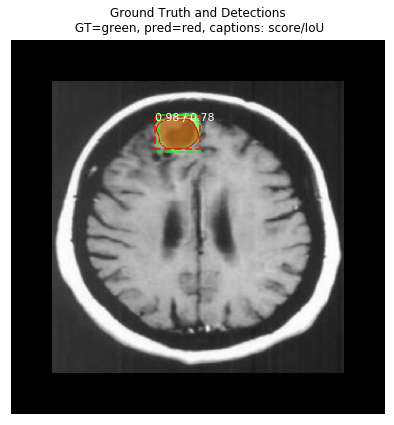

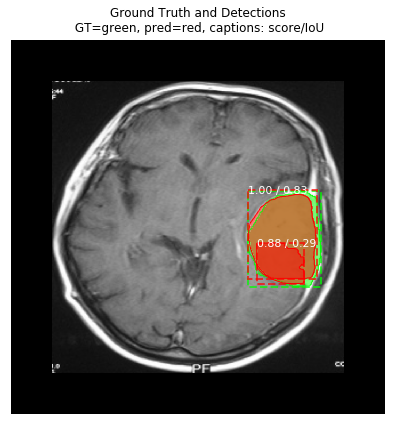

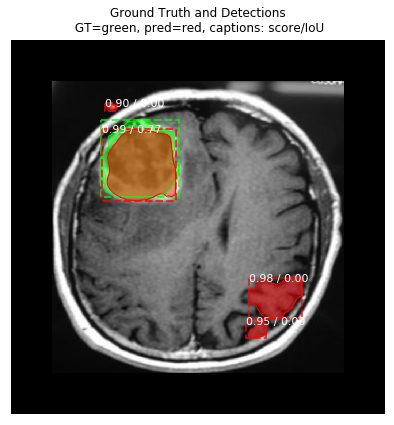

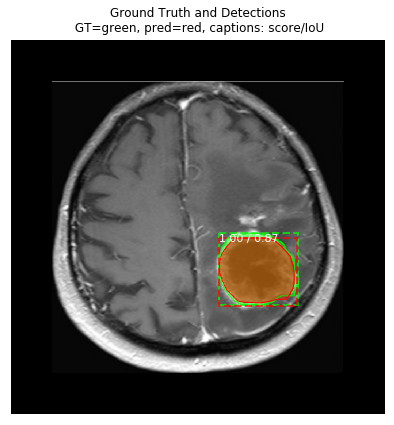

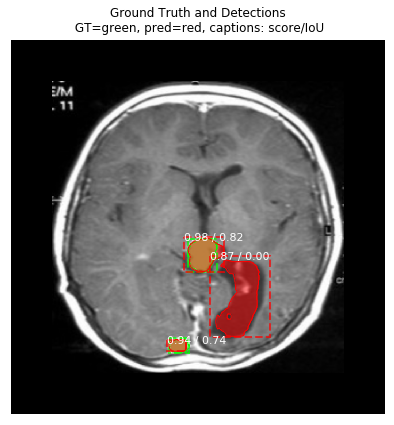

In [0]:
predict_and_plot_all_data(dataset_val)

In [0]:
##############################################################################################################
##############################################################################################################
##############################################################################################################

In [0]:
model = modellib.MaskRCNN(
    mode='training', 
    config=config, 
    model_dir=DEFAULT_LOGS_DIR
)

model.load_weights(
    COCO_MODEL_PATH, 
    by_name=True, 
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)

# Training dataset.
dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'train')
dataset_train.prepare()

# Validation dataset
dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'val')
dataset_val.prepare()

dataset_test = BrainScanDataset()
dataset_test.load_brain_scan(DATASET_DIR, 'test')
dataset_test.prepare()

# Since we're using a very small dataset, and starting from
# COCO trained weights, we don't need to train too long. Also,
# no need to train all layers, just the heads should do it.
print("Training network heads")
model.train(
    dataset_train, dataset_val,
    learning_rate=1e-3,
    epochs=25,
    layers='heads'
)

# Recreate the model in inference mode
model = modellib.MaskRCNN(
    mode="inference", 
    config=config,
    model_dir=DEFAULT_LOGS_DIR
)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

print('validation iou score is:', mean_iou_score(dataset_val))
print('test iou score is:', mean_iou_score(dataset_test))

Training network heads

Starting at epoch 0. LR=0.001

Checkpoint Path: logs/tumor_detector20200121T1737/mask_rcnn_tumor_detector_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistri

/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/keras/engine/training_generator.py:49: UserWarning: Using a generator with `use_multi

Epoch 1/25
100/100 [==============================] - 98s 977ms/step - loss: 1.8811 - rpn_class_loss: 0.0272 - rpn_bbox_loss: 0.7027 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.6876 - mrcnn_mask_loss: 0.3819 - val_loss: 1.5125 - val_rpn_class_loss: 0.0363 - val_rpn_bbox_loss: 0.4579 - val_mrcnn_class_loss: 0.0795 - val_mrcnn_bbox_loss: 0.5959 - val_mrcnn_mask_loss: 0.3430
Epoch 2/25
100/100 [==============================] - 63s 626ms/step - loss: 1.1658 - rpn_class_loss: 0.0227 - rpn_bbox_loss: 0.3130 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.4494 - mrcnn_mask_loss: 0.3101 - val_loss: 1.2591 - val_rpn_class_loss: 0.0264 - val_rpn_bbox_loss: 0.3470 - val_mrcnn_class_loss: 0.0745 - val_mrcnn_bbox_loss: 0.4758 - val_mrcnn_mask_loss: 0.3354
Epoch 3/25
100/100 [==============================] - 63s 626ms/step - loss: 0.8205 - rpn_class_loss: 0.0148 - rpn_bbox_loss: 0.2180 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.2993 - mrcnn_mask_loss: 0.2407 - val_loss: 1.6079 - val_rpn_c

In [0]:
##################################################################

In [0]:
model = modellib.MaskRCNN(
    mode='training', 
    config=config, 
    model_dir=DEFAULT_LOGS_DIR
)

model.load_weights(
    NUCLEUS_MODEL_PATH, 
    by_name=True, 
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)

# Training dataset.
dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'train')
dataset_train.prepare()

# Validation dataset
dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'val')
dataset_val.prepare()

dataset_test = BrainScanDataset()
dataset_test.load_brain_scan(DATASET_DIR, 'test')
dataset_test.prepare()

# Since we're using a very small dataset, and starting from
# COCO trained weights, we don't need to train too long. Also,
# no need to train all layers, just the heads should do it.
print("Training network heads")
model.train(
    dataset_train, dataset_val,
    learning_rate=1e-3,
    epochs=25,
    layers='heads'
)

# Recreate the model in inference mode
model = modellib.MaskRCNN(
    mode="inference", 
    config=config,
    model_dir=DEFAULT_LOGS_DIR
)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

print('validation iou score is:', mean_iou_score(dataset_val))
print('test iou score is:', mean_iou_score(dataset_test))

Training network heads

Starting at epoch 0. LR=0.001

Checkpoint Path: logs/tumor_detector20200121T2046/mask_rcnn_tumor_detector_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistri

/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/keras/engine/training_generator.py:49: UserWarning: Using a generator with `use_multi

Epoch 1/25
100/100 [==============================] - 113s 1s/step - loss: 2.0069 - rpn_class_loss: 0.0295 - rpn_bbox_loss: 0.6608 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.7994 - mrcnn_mask_loss: 0.4385 - val_loss: 1.5561 - val_rpn_class_loss: 0.0312 - val_rpn_bbox_loss: 0.3452 - val_mrcnn_class_loss: 0.0850 - val_mrcnn_bbox_loss: 0.7178 - val_mrcnn_mask_loss: 0.3769
Epoch 2/25
100/100 [==============================] - 65s 646ms/step - loss: 1.3376 - rpn_class_loss: 0.0200 - rpn_bbox_loss: 0.3576 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.5606 - mrcnn_mask_loss: 0.3173 - val_loss: 1.3220 - val_rpn_class_loss: 0.0336 - val_rpn_bbox_loss: 0.3423 - val_mrcnn_class_loss: 0.0771 - val_mrcnn_bbox_loss: 0.5031 - val_mrcnn_mask_loss: 0.3659
Epoch 3/25
100/100 [==============================] - 64s 641ms/step - loss: 1.1123 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.3081 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.4606 - mrcnn_mask_loss: 0.2673 - val_loss: 1.3812 - val_rpn_cla

In [0]:
################################################################
################################################################

In [0]:
model = modellib.MaskRCNN(
    mode='training', 
    config=config, 
    model_dir=DEFAULT_LOGS_DIR
)

model.load_weights(
    BALLOON_MODEL_PATH, 
    by_name=True, 
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)

# Training dataset.
dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'train')
dataset_train.prepare()

# Validation dataset
dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'val')
dataset_val.prepare()

dataset_test = BrainScanDataset()
dataset_test.load_brain_scan(DATASET_DIR, 'test')
dataset_test.prepare()

# Since we're using a very small dataset, and starting from
# COCO trained weights, we don't need to train too long. Also,
# no need to train all layers, just the heads should do it.
print("Training network heads")
model.train(
    dataset_train, dataset_val,
    learning_rate=1e-3,
    epochs=25,
    layers='heads'
)

# Recreate the model in inference mode
model = modellib.MaskRCNN(
    mode="inference", 
    config=config,
    model_dir=DEFAULT_LOGS_DIR
)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

print('validation iou score is:', mean_iou_score(dataset_val))
print('test iou score is:', mean_iou_score(dataset_test))

Training network heads

Starting at epoch 0. LR=0.001

Checkpoint Path: logs/tumor_detector20200121T2126/mask_rcnn_tumor_detector_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistri

/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/keras/engine/training_generator.py:49: UserWarning: Using a generator with `use_multi

Epoch 1/25
100/100 [==============================] - 114s 1s/step - loss: 1.7385 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 0.6376 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.6592 - mrcnn_mask_loss: 0.3063 - val_loss: 1.5058 - val_rpn_class_loss: 0.0317 - val_rpn_bbox_loss: 0.4418 - val_mrcnn_class_loss: 0.0753 - val_mrcnn_bbox_loss: 0.5868 - val_mrcnn_mask_loss: 0.3702
Epoch 2/25
100/100 [==============================] - 65s 647ms/step - loss: 1.0128 - rpn_class_loss: 0.0172 - rpn_bbox_loss: 0.2967 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.3595 - mrcnn_mask_loss: 0.2798 - val_loss: 1.5020 - val_rpn_class_loss: 0.0381 - val_rpn_bbox_loss: 0.5928 - val_mrcnn_class_loss: 0.0567 - val_mrcnn_bbox_loss: 0.5102 - val_mrcnn_mask_loss: 0.3042
Epoch 3/25
100/100 [==============================] - 64s 642ms/step - loss: 0.8612 - rpn_class_loss: 0.0218 - rpn_bbox_loss: 0.2250 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.3098 - mrcnn_mask_loss: 0.2549 - val_loss: 1.3679 - val_rpn_cla

In [0]:
##################################################################
##################################################################

In [0]:
model = modellib.MaskRCNN(
    mode='training', 
    config=config, 
    model_dir=DEFAULT_LOGS_DIR
)

model.load_weights(
    SHAPES_MODEL_PATH, 
    by_name=True, 
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)

# Training dataset.
dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'train')
dataset_train.prepare()

# Validation dataset
dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'val')
dataset_val.prepare()

dataset_test = BrainScanDataset()
dataset_test.load_brain_scan(DATASET_DIR, 'test')
dataset_test.prepare()

# Since we're using a very small dataset, and starting from
# COCO trained weights, we don't need to train too long. Also,
# no need to train all layers, just the heads should do it.
print("Training network heads")
model.train(
    dataset_train, dataset_val,
    learning_rate=1e-3,
    epochs=25,
    layers='heads'
)

# Recreate the model in inference mode
model = modellib.MaskRCNN(
    mode="inference", 
    config=config,
    model_dir=DEFAULT_LOGS_DIR
)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

print('validation iou score is:', mean_iou_score(dataset_val))
print('test iou score is:', mean_iou_score(dataset_test))

Training network heads

Starting at epoch 0. LR=0.001

Checkpoint Path: logs/tumor_detector20200121T2206/mask_rcnn_tumor_detector_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistri

/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/keras/engine/training_generator.py:49: UserWarning: Using a generator with `use_multi

Epoch 1/25
100/100 [==============================] - 114s 1s/step - loss: 1.8220 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 0.5471 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.6513 - mrcnn_mask_loss: 0.4721 - val_loss: 1.6392 - val_rpn_class_loss: 0.0334 - val_rpn_bbox_loss: 0.3466 - val_mrcnn_class_loss: 0.1119 - val_mrcnn_bbox_loss: 0.7487 - val_mrcnn_mask_loss: 0.3986
Epoch 2/25
100/100 [==============================] - 65s 650ms/step - loss: 1.0484 - rpn_class_loss: 0.0161 - rpn_bbox_loss: 0.2584 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.4505 - mrcnn_mask_loss: 0.2720 - val_loss: 1.4835 - val_rpn_class_loss: 0.0324 - val_rpn_bbox_loss: 0.4961 - val_mrcnn_class_loss: 0.0696 - val_mrcnn_bbox_loss: 0.5365 - val_mrcnn_mask_loss: 0.3489
Epoch 3/25
100/100 [==============================] - 65s 650ms/step - loss: 0.9128 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.2599 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.3529 - mrcnn_mask_loss: 0.2367 - val_loss: 1.4069 - val_rpn_cla

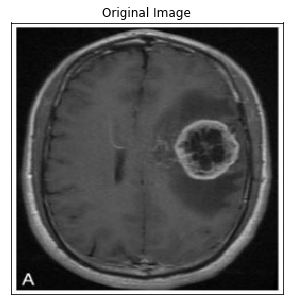

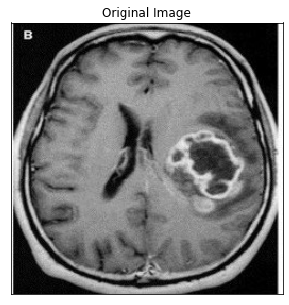

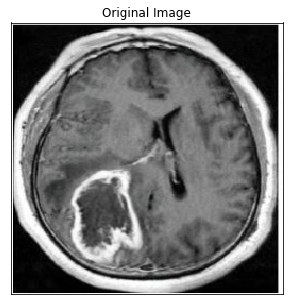

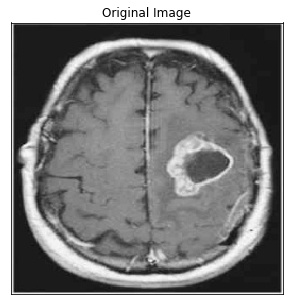

In [0]:
display_all_data(dataset_test)

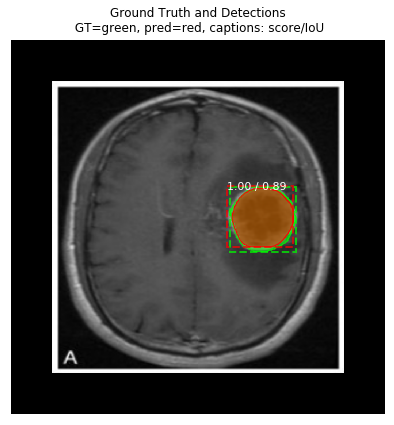

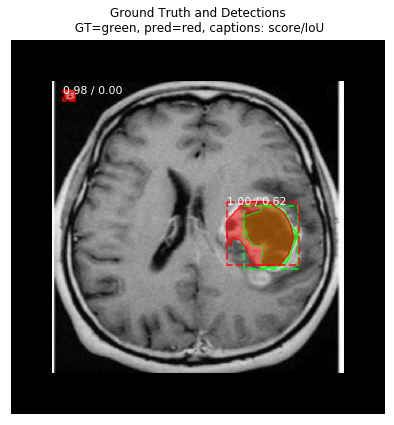

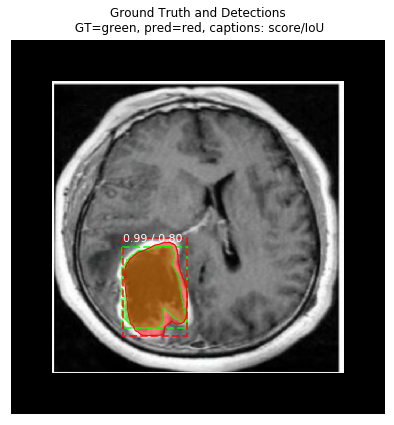

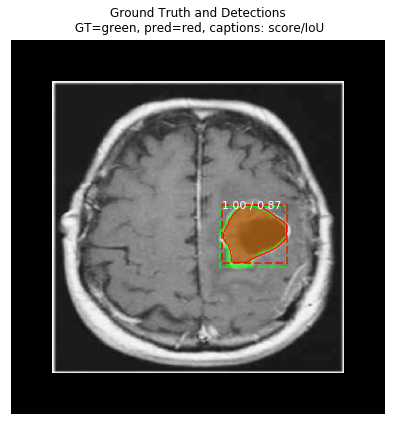

In [0]:
predict_and_plot_all_data(dataset_test)

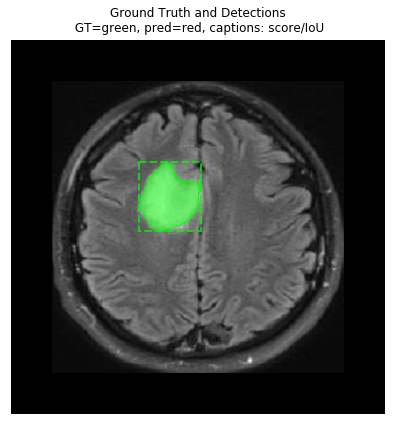

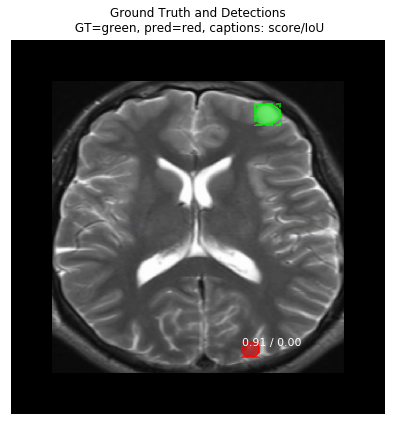

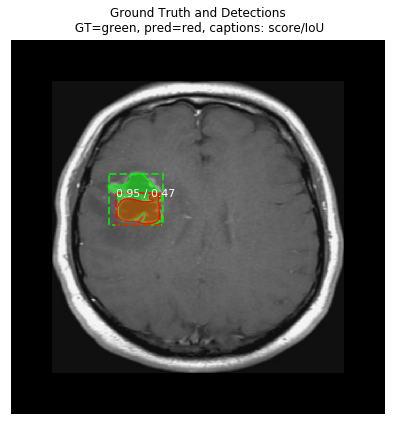

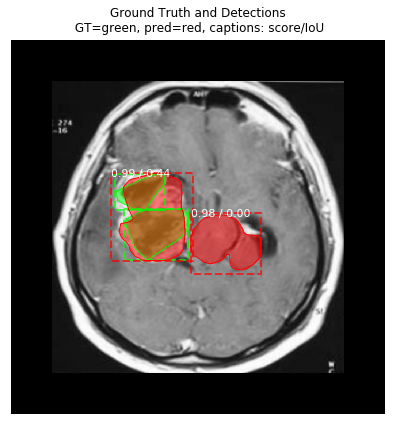

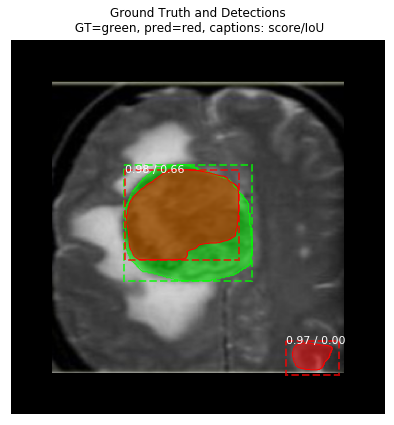

...

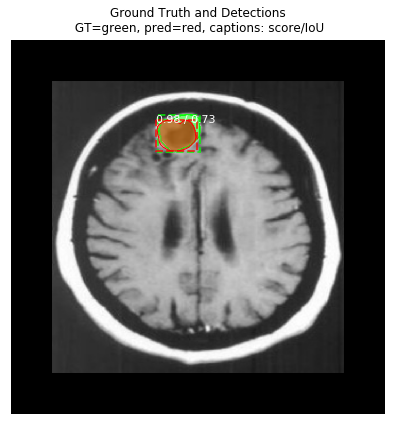

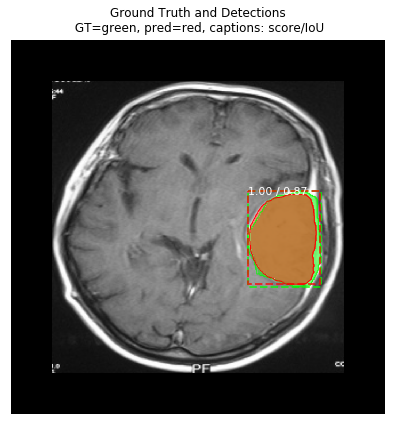

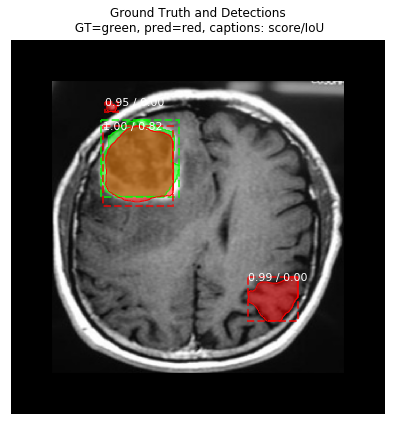

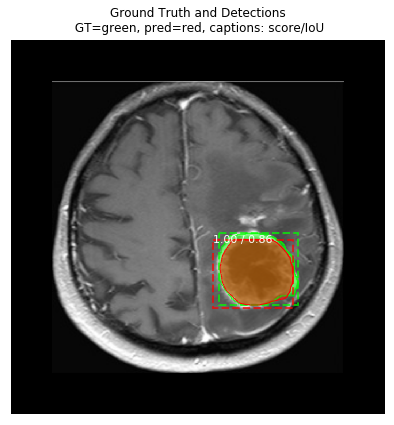

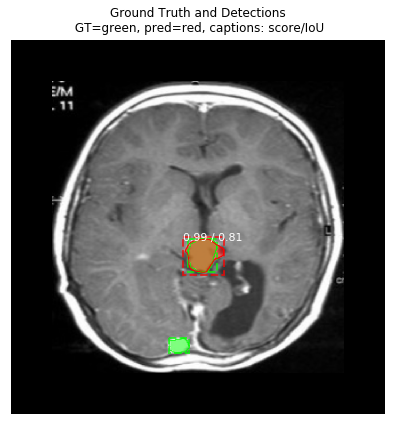

In [0]:
predict_and_plot_all_data(dataset_val)